In [3]:
import os
import pickle
import numpy as np
from sklearn.manifold import TSNE
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from txgnn import TxData
from goatools.obo_parser import GODag
from goatools.godag.go_tasks import get_go2parents, get_go2children
import torch
from sklearn.cluster import KMeans
import numpy as np
from collections import Counter

/home/tysinger/.conda/envs/txgnn_env2/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [16]:
import torch
emb_path = '/om/user/tysinger/models/node_emb.pkl'
with open(emb_path, 'rb') as f:
    embeddings = pickle.load(f)

In [17]:
prot_embs = embeddings['gene/protein']
drug_embs = embeddings['drug']

In [18]:
# Compute t-SNE
tsne = TSNE(n_components=2, verbose=0, perplexity=40, n_iter=300)
prot_tsne_results = tsne.fit_transform(prot_embs)

tsne = TSNE(n_components=2, verbose=0, perplexity=40, n_iter=300)
drug_tsne_results = tsne.fit_transform(drug_embs)

In [4]:
class GO():
    def __init__(self, dirname, node_type = 'molecular_function', TxData_inst = None):
        self.obo_path = os.path.join(dirname, 'go-basic.obo')
        self.go_dag = GODag(self.obo_path)
        self.node_type = node_type
        self.get_goid_dict()
        if TxData_inst:
            self.TxData_inst = TxData_inst
        else:
            self.TxData_inst = TxData(data_folder_path = '/om/user/tysinger/kg/')
            self.TxData_inst.prepare_split(split = 'random', seed = 42, no_kg = False)
        
        self.ordered_goids = self.get_ordered_goids()
    
    def get_ordered_goids(self):
        x_df = self.TxData_inst.df[self.TxData_inst.df.x_type == self.node_type][['x_idx','x_id']]
        y_df = self.TxData_inst.df[self.TxData_inst.df.y_type == self.node_type][['y_idx','y_id']]
        x_zipped = set(zip(x_df['x_idx'], x_df['x_id']))
        y_zipped = set(zip(y_df['y_idx'], y_df['y_id']))
        all_nodes = x_zipped.union(y_zipped)
        idx2id = dict(all_nodes)
        nodes = pd.read_csv('/om/user/tysinger/kg/nodes.csv')
        nodes_mf = nodes[nodes.node_type == self.node_type]
        id2name = dict(zip(nodes_mf['node_id'], nodes_mf['node_name']))
        ordered_names = []
        ordered_ids = []
        for node in self.TxData_inst.G.nodes(self.node_type).tolist():
            id = idx2id[node]
            ordered_ids.append(str(int(float(id))))
            name = id2name[str(int(float(id)))]
            ordered_names.append(name)
        def get_go_id(id):
            while len(id) != 7:
                id = '0' + id
            return 'GO:' + id
        ordered_goids = [get_go_id(id) for id in ordered_ids]
        return ordered_goids
    
    def get_sub_go_lists(self, go_id):
        go_cluster_list = [child.item_id for child in list(self.go_dag[go_id].children)]
        goid2name = {goid:self.go_dag[goid].name for goid in go_cluster_list}
        goid2children = {goid:self.go_dag[goid].get_all_children() for goid in go_cluster_list}
        return goid2name, goid2children

    def get_goid_dict(self):
        if self.node_type == 'molecular_function':
            self.all_go_cluster_list = ['GO:0005488', 'GO:0005198', 'GO:0003824', 'GO:0038024', 'GO:0016209',
                    'GO:0140104', 'GO:0005215', 'GO:0045182', 'GO:0140110',
                    'GO:0098772', 'GO:0003674']
        elif self.node_type == 'biological_process':
            self.all_go_cluster_list = [
            'GO:0022414', 'GO:0032501', 'GO:0009987', 'GO:0008283', 'GO:0007610', 
            'GO:0032502', 'GO:0008152', 'GO:0002376', 'GO:0050896', 
            'GO:0040007', 'GO:0051179', 'GO:0099531', 'GO:0040011', 'GO:0023052', 
            'GO:0098754', 'GO:0000003', 'GO:0044848', 'GO:0043473', 'GO:0048511', 'GO:0065007', 'GO:0001906', 'GO:0098743', 'GO:0071840', 
            'GO:0019740', 'GO:0009758', 'GO:0015976', 'GO:0006794', 'GO:0006791'
            ]
            self.filtered_go_cluster_list = [
            'GO:0022414', 'GO:0032501', 'GO:0009987', 'GO:0008283', 'GO:0007610', 
            'GO:0032502', 'GO:0008152', 'GO:0002376', 'GO:0050896', 
            'GO:0040007', 'GO:0051179', 'GO:0023052', 
            'GO:0065007', 'GO:0071840'
            ]
            self.filtered_goid2name = {goid:self.go_dag[goid].name for goid in self.filtered_go_cluster_list}
            self.filtered_goid2children = {goid:self.go_dag[goid].get_all_children() for goid in self.filtered_go_cluster_list}

        self.all_goid2name = {goid:self.go_dag[goid].name for goid in self.all_go_cluster_list}
        self.all_goid2children = {goid:self.go_dag[goid].get_all_children() for goid in self.all_go_cluster_list}
    
    def parent_go_list(self, goid2children, agg = True, type = '', threshold = 50, return_list=False):
        parent_go = []
        for id in self.ordered_goids:
            parent = 'Other'
            for go_parent in goid2children:
                if id in goid2children[go_parent]:
                    parent = go_parent
                    break
            parent_go.append(parent)
        count = Counter(parent_go)
        print(count)
        if agg:
            low_freq_ids = {go_id for go_id, cnt in count.items() if cnt <= threshold}
            if return_list:
                return ['Other' + type if go_id in low_freq_ids else go_id for go_id in parent_go]
            else:
                self.parent_go = ['Other' + type if go_id in low_freq_ids else go_id for go_id in parent_go]


In [8]:
class Embeddings():
    def __init__(self, embed_path, TxData_inst = None):
        with open(embed_path, 'rb') as f:
            self.embeddings = pickle.load(f)
        
        self.prot_embs = self.embeddings['gene/protein']
        self.drug_embs = self.embeddings['drug']
        if TxData_inst:
            self.TxData_inst = TxData_inst
        else:
            self.TxData_inst = TxData(data_folder_path = '/om/user/tysinger/kg/')
            self.TxData_inst.prepare_split(split = 'random', seed = 42, no_kg = False)

    def compute_tsne(self, n_components=2, perplexity=40, n_iter=300, embed_type = 'protein'):
        tsne = TSNE(n_components=2, verbose=0, perplexity=40, n_iter=300)
        if embed_type == 'protein':
            self.prot_tsne_results = tsne.fit_transform(self.prot_embs)
        elif embed_type == 'drug':
            self.drug_tsne_results = tsne.fit_transform(self.drug_embs)

    def get_clusters(self, parent_go, goid2name, node_type='molecular_function', edge_type='molfunc_protein'):
        all_prot_functions = []
        for idx, prot_idx in enumerate(self.TxData_inst.G.nodes('gene/protein').tolist()):
            nodes = self.TxData_inst.G.successors(prot_idx, etype=edge_type)
            num_nodes = len(self.TxData_inst.G.nodes(node_type))
            node_profile = torch.zeros((num_nodes,))
            node_profile[nodes] = 1.
            profile = node_profile.tolist()
            filtered_strings = [parent_go[i] for i in range(len(profile)) if profile[i] == 1]
            unique_counts = Counter(filtered_strings)
            if 'Other' in unique_counts:
                del unique_counts['Other']
            if len(unique_counts) == 0:
                key_max = 'Other'
            else:
                key_max = max(unique_counts, key=unique_counts.get)
            all_prot_functions.append(key_max)
        all_prot_functions_names = [goid2name[goid] if goid[:5] != 'Other' else goid for goid in all_prot_functions]
        return all_prot_functions, all_prot_functions_names

    def compute_kmeans(self, n_clusters=40):
        kmeans = KMeans(n_clusters=n_clusters, random_state=0)
        kmeans.fit(self.prot_embs)
        self.cluster_assignments = kmeans.labels_

        self.cluster_dict = {}
        for index, cluster in enumerate(self.cluster_assignments):
            if cluster not in self.cluster_dict:
                self.cluster_dict[cluster] = [index]
            else:
                self.cluster_dict[cluster].append(index)
    
    def get_knn_cluster_labels(self, parent_go, goid2name, node_type='molecular_function', edge_type='molfunc_protein', filter=None):
        all_cluster_functions = {}
        for cluster in self.cluster_dict:
            proteins = self.cluster_dict[cluster]
            cluster_functions = []
            for prot_idx in proteins:
                nodes = self.TxData_inst.G.successors(prot_idx, etype=edge_type)
                num_nodes = len(self.TxData_inst.G.nodes(node_type))
                node_profile = torch.zeros((num_nodes,))
                node_profile[nodes] = 1.
                profile = node_profile.tolist()
                filtered_strings = [parent_go[i] for i in range(len(profile)) if profile[i] == 1]
                unique_counts = Counter(filtered_strings)
                if 'Other' in unique_counts:
                    del unique_counts['Other']
                if filter:
                    if filter in unique_counts:
                        del unique_counts[filter]
                if len(unique_counts) == 0:
                    key_max = 'Other'
                else:
                    key_max = max(unique_counts, key=unique_counts.get)
                cluster_functions.append(key_max)
            unique_cluster_counts = Counter(cluster_functions)
            if 'Other' in unique_cluster_counts:
                del unique_cluster_counts['Other']
            all_cluster_functions[cluster] = max(unique_cluster_counts, key=unique_cluster_counts.get)
        all_cluster_functions_names = {}
        for cluster in all_cluster_functions:
            if all_cluster_functions[cluster][:5] != 'Other':
                all_cluster_functions_names[cluster] = goid2name[all_cluster_functions[cluster]]
            else:
                all_cluster_functions_names[cluster] = all_cluster_functions[cluster]
        return all_cluster_functions, all_cluster_functions_names
    
    def plot_kmeans(self, cluster_list, title= 'Protein Embeddings: Clustered by Biological Processes (k=40)'):
        df = pd.DataFrame()
        df['t-SNE 1'] = self.prot_tsne_results[:,0]
        df['t-SNE 2'] = self.prot_tsne_results[:,1]
        df['cluster'] = cluster_list

        plt.figure(figsize=(16,10))

        palette = sns.color_palette("husl", 12)
        
        sns.scatterplot(
            x="t-SNE 1", y="t-SNE 2",
            hue='cluster',
            palette = palette,
            data=df[df['cluster'] == 'Other'],
            legend=False,  
            alpha=0.5
        )

        sns.scatterplot(
            x="t-SNE 1", y="t-SNE 2",
            hue='cluster',
            palette = palette,
            data=df[df['cluster'] != 'Other'],
            legend="full",
            alpha=0.6,
            s=15 
        )
        plt.title(title)
        plt.legend(title='Clusters')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
        plt.subplots_adjust(right=0.7)
        plt.show()

    def plot(self, cluster_list, title= 'Protein Embeddings', colors = sns.color_palette("tab10"), legend="full", other=True):
        df = pd.DataFrame()
        df['t-SNE 1'] = self.prot_tsne_results[:,0]
        df['t-SNE 2'] = self.prot_tsne_results[:,1]
        df['cluster'] = cluster_list
        colors = colors

        palette = {cluster: 'lightgrey' if cluster == 'Other' else colors.pop() for cluster in set(cluster_list)}
        plt.figure(figsize=(16,10))
        if other: 
            sns.scatterplot(
                x="t-SNE 1", y="t-SNE 2",
                hue='cluster',
                palette=palette,
                data=df[df['cluster'] == 'Other'],
                legend=False,  
                alpha=0.5
            )

        sns.scatterplot(
            x="t-SNE 1", y="t-SNE 2",
            hue='cluster',
            palette=palette,
            data=df[df['cluster'] != 'Other'],
            legend=legend,
            alpha=0.4  
        )
        plt.title(title)
        plt.legend(title='Clusters')
        plt.show()


In [13]:
def visualize_pipeline(embed_path, node_type, TxData_inst=None, kmeans=False):
    dirname = '/om/user/tysinger/TxGNN/txgnn/data_splits/'
    GO_MF = GO(dirname, TxData_inst=TxData_inst, node_type=node_type)
    GO_MF.parent_go_list(GO_MF.all_goid2children)

    if node_type == 'molecular_function':
        binding_id2name, binding_id2children = GO_MF.get_sub_go_lists('GO:0005488') 
        binding_parent_go = GO_MF.parent_go_list(binding_id2children, type=' Binding', threshold = 30, return_list=True)

        catalytic_id2name, catalytic_id2children = GO_MF.get_sub_go_lists('GO:0003824')
        catalytic_parent_go = GO_MF.parent_go_list(catalytic_id2children, type=' Catalytic', threshold = 30, return_list=True) 

        transporter_id2name, transporter_id2children = GO_MF.get_sub_go_lists('GO:0005215') 
        transporter_parent_go = GO_MF.parent_go_list(transporter_id2children, type=' Transporter', threshold = 30, return_list=True)
    
    elif node_type == 'biological_process':
        bioreg_id2name, bioreg_id2children = GO_MF.get_sub_go_lists('GO:0065007') 
        bioreg_parent_go = GO_MF.parent_go_list(bioreg_id2children, type=' Biological Regulation', threshold = 30, return_list=True) 

        metabol_id2name, metabol_id2children = GO_MF.get_sub_go_lists('GO:0008152') 
        metabol_parent_go = GO_MF.parent_go_list(metabol_id2children, type=' Metabolic Process', threshold = 30, return_list=True)

    # get 2nd level go ids
    second_level_cluster_list = []
    for go in GO_MF.all_go_cluster_list:
        new = [child.item_id for child in list(GO_MF.go_dag[go].children)]
        second_level_cluster_list = second_level_cluster_list + new

    second_level_goid2name = {goid:GO_MF.go_dag[goid].name for goid in second_level_cluster_list}
    second_level_goid2children = {goid:GO_MF.go_dag[goid].get_all_children() for goid in second_level_cluster_list}
    second_level_parent_go = GO_MF.parent_go_list(second_level_goid2children, threshold=20, return_list=True)
    
    embeddings = Embeddings(embed_path, TxData_inst=TxData_inst)

    print('Computing T-SNE ... ')
    embeddings.compute_tsne()
    if kmeans:
        print('Computing k-mean clusters ... ')
        embeddings.compute_kmeans()

    if node_type == 'molecular_function' and not kmeans:
        all_mf_cluster_functions, all_mf_cluster_functions_names = embeddings.get_clusters(GO_MF.parent_go, GO_MF.all_goid2name, node_type='molecular_function', edge_type='molfunc_protein')
        binding_prot_functions, binding_prot_functions_names = embeddings.get_clusters(binding_parent_go, binding_id2name)
        catalytic_prot_functions, catalytic_prot_functions_names = embeddings.get_clusters(catalytic_parent_go, catalytic_id2name)
        transporter_prot_functions, transporter_prot_functions_names = embeddings.get_clusters(transporter_parent_go, transporter_id2name)
        embeddings.plot(all_mf_cluster_functions_names, colors = sns.color_palette("tab10"))
        embeddings.plot(binding_prot_functions_names, title = 'Protein Embeddings: Binding', colors = sns.color_palette("tab10"))
        embeddings.plot(catalytic_prot_functions_names, title = 'Protein Embeddings: Catalytic Activity', colors = sns.color_palette("tab10"))
        embeddings.plot(transporter_prot_functions_names, title = 'Protein Embeddings: Transporter', colors = sns.color_palette("tab10"))
    
    elif node_type == 'biological_process' and not kmeans:
        all_bp_cluster_functions, all_bp_cluster_functions_names = embeddings.get_clusters(GO_MF.parent_go, GO_MF.all_goid2name, node_type='biological_process', edge_type='bioprocess_protein')
        bioreg_prot_functions, bioreg_prot_functions_names = embeddings.get_clusters(bioreg_parent_go, bioreg_id2name, node_type='biological_process', edge_type='bioprocess_protein')
        metabol_prot_functions, metabol_prot_functions_names = embeddings.get_clusters(metabol_parent_go, metabol_id2name, node_type='biological_process', edge_type='bioprocess_protein')
        second_level_prot, second_level_prot_names = embeddings.get_clusters(second_level_parent_go, second_level_goid2name, node_type='biological_process', edge_type='bioprocess_protein')
        embeddings.plot(all_bp_cluster_functions_names, colors = sns.color_palette("tab10"))
        embeddings.plot(bioreg_prot_functions_names, title = 'Protein Embeddings: Biological Regulation', colors = sns.color_palette("tab10"))
        embeddings.plot(metabol_prot_functions_names, title = 'Protein Embeddings: Metabolic Process', colors = sns.color_palette("tab10"))
        embeddings.plot(second_level_prot_names, title = 'Protein Embeddings', colors = sns.color_palette("tab20"))
    
    elif node_type == 'biological_process' and kmeans:
        #all_cluster_functions, all_cluster_functions_names = embeddings.get_knn_cluster_labels(GO_MF.parent_go, GO_MF.all_goid2name, node_type='biological_process', edge_type='bioprocess_protein')
        second_level_cluster_functions, second_level_cluster_functions_names = embeddings.get_knn_cluster_labels(second_level_parent_go, second_level_goid2name, filter='GO:0050789', node_type='biological_process', edge_type='bioprocess_protein')
        
        #go_assignments = [all_cluster_functions_names[cluster] for cluster in embeddings.cluster_assignments]
        second_level_go_assignments = [second_level_cluster_functions_names[cluster] for cluster in embeddings.cluster_assignments]
        
        #embeddings.plot_kmeans(go_assignments)
        embeddings.plot_kmeans(second_level_go_assignments)
    
    elif node_type == 'molecular_function' and kmeans:
        #all_cluster_functions, all_cluster_functions_names = embeddings.get_knn_cluster_labels(GO_MF.parent_go, GO_MF.all_goid2name, node_type='molecular_function', edge_type='molfunc_protein')
        second_level_cluster_functions, second_level_cluster_functions_names = embeddings.get_knn_cluster_labels(second_level_parent_go, second_level_goid2name, node_type='molecular_function', edge_type='molfunc_protein')
        
        #go_assignments = [all_cluster_functions_names[cluster] for cluster in embeddings.cluster_assignments]
        second_level_go_assignments = [second_level_cluster_functions_names[cluster] for cluster in embeddings.cluster_assignments]
        
        #embeddings.plot_kmeans(go_assignments)
        embeddings.plot_kmeans(second_level_go_assignments)


In [6]:
mf_embed_path = '/om/user/tysinger/embeddings/finetune_MF_emb.pkl'
bp_embed_path = '/om/user/tysinger/embeddings/finetune_BP_emb.pkl'
mf_bp_embed_path = '/om/user/tysinger/embeddings/finetune_MF_BP_emb.pkl'

TxData_inst = TxData(data_folder_path = '/om/user/tysinger/kg/')
TxData_inst.prepare_split(split = 'random', seed = 42, no_kg = False)

Found local copy...
Found local copy...
Found local copy...
Found saved processed KG... Loading...


Splits detected... Loading splits....
Creating DGL graph....
Done!


In [40]:
dirname = '/om/user/tysinger/TxGNN/txgnn/data_splits/'
GO_MF = GO(dirname, TxData_inst=TxData_inst, node_type='biological_process')
GO_MF.parent_go_list(GO_MF.all_goid2children)

/om/user/tysinger/TxGNN/txgnn/data_splits/go-basic.obo: fmt(1.2) rel(2023-10-09) 46,296 Terms
Counter({'GO:0009987': 9903, 'GO:0065007': 9701, 'Other': 1906, 'GO:0032502': 1659, 'GO:0008152': 1528, 'GO:0032501': 1184, 'GO:0050896': 1009, 'GO:0022414': 789, 'GO:0051179': 569, 'GO:0002376': 207, 'GO:0044848': 63, 'GO:0040007': 55, 'GO:0040011': 39, 'GO:0098754': 10, 'GO:0048511': 7, 'GO:0000003': 7, 'GO:0043473': 6})


In [43]:
embeddings = Embeddings(mf_bp_embed_path, TxData_inst=TxData_inst)
embeddings.compute_tsne()
embeddings.compute_kmeans()

/om/user/tysinger/TxGNN/txgnn/data_splits/go-basic.obo: fmt(1.2) rel(2023-10-09) 46,296 Terms
Counter({'GO:0003824': 7381, 'GO:0005488': 1816, 'GO:0005215': 989, 'GO:0003674': 428, 'Other': 273, 'GO:0098772': 183, 'GO:0005198': 42, 'GO:0140110': 22, 'GO:0038024': 17, 'GO:0140104': 15, 'GO:0045182': 3})
Counter({'Other': 9396, 'GO:0005515': 912, 'GO:0097159': 475, 'GO:0044877': 94, 'GO:0043167': 59, 'GO:0036094': 54, 'GO:0030246': 45, 'GO:0033218': 25, 'GO:0008289': 24, 'GO:0097367': 22, 'GO:0042562': 18, 'GO:1901681': 13, 'GO:0051540': 5, 'GO:0097243': 5, 'GO:0050840': 5, 'GO:0003823': 4, 'GO:0072341': 2, 'GO:0048038': 2, 'GO:0051192': 2, 'GO:0019215': 1, 'GO:0070026': 1, 'GO:0046812': 1, 'GO:0031409': 1, 'GO:0005549': 1, 'GO:0070025': 1, 'GO:0043176': 1})
Counter({'Other': 3800, 'GO:0016491': 2317, 'GO:0016740': 2281, 'GO:0016787': 1411, 'GO:0016829': 613, 'GO:0016853': 262, 'GO:0016874': 241, 'GO:0140640': 210, 'GO:0032451': 22, 'GO:0009975': 8, 'GO:0140096': 2, 'GO:1904091': 2})
Cou

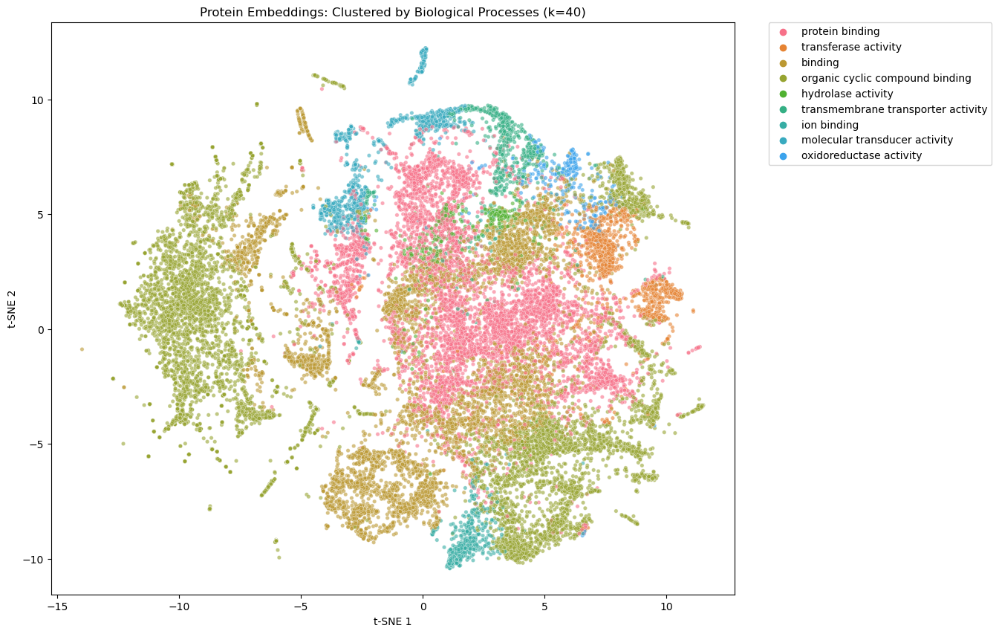

In [14]:
visualize_pipeline(embed_path=mf_bp_embed_path, node_type = 'molecular_function', TxData_inst=TxData_inst, kmeans=True)

/om/user/tysinger/TxGNN/txgnn/data_splits/go-basic.obo: fmt(1.2) rel(2023-10-09) 46,296 Terms
Counter({'GO:0009987': 9903, 'GO:0065007': 9701, 'Other': 1906, 'GO:0032502': 1659, 'GO:0008152': 1528, 'GO:0032501': 1184, 'GO:0050896': 1009, 'GO:0022414': 789, 'GO:0051179': 569, 'GO:0002376': 207, 'GO:0044848': 63, 'GO:0040007': 55, 'GO:0040011': 39, 'GO:0098754': 10, 'GO:0048511': 7, 'GO:0000003': 7, 'GO:0043473': 6})
Counter({'Other': 17527, 'GO:0050789': 10318, 'GO:0065008': 429, 'GO:0065009': 363, 'GO:0006885': 3, 'GO:0060378': 2})
Counter({'Other': 22745, 'GO:0071704': 5238, 'GO:0019748': 364, 'GO:0044237': 174, 'GO:0044281': 20, 'GO:0006807': 19, 'GO:0051189': 19, 'GO:0070988': 17, 'GO:0042440': 13, 'GO:1902421': 4, 'GO:0045730': 4, 'GO:0042445': 3, 'GO:0016999': 3, 'GO:0070085': 3, 'GO:1990845': 2, 'GO:1901275': 2, 'GO:1901286': 2, 'GO:1901764': 2, 'GO:1901902': 2, 'GO:0018933': 2, 'GO:0032963': 2, 'GO:0044238': 1, 'GO:0006116': 1})
Counter({'GO:0050789': 9208, 'GO:0044237': 4122, '

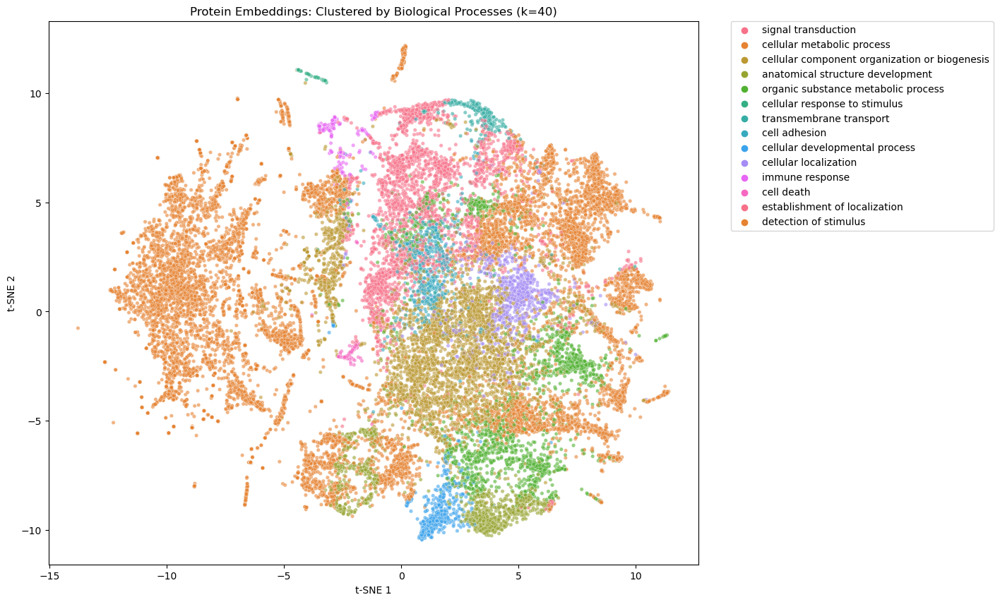

In [19]:
visualize_pipeline(embed_path=mf_bp_embed_path, node_type = 'biological_process', TxData_inst=TxData_inst, kmeans=True)

/om/user/tysinger/TxGNN/txgnn/data_splits/go-basic.obo: fmt(1.2) rel(2023-10-09) 46,296 Terms
Counter({'GO:0003824': 7381, 'GO:0005488': 1816, 'GO:0005215': 989, 'GO:0003674': 428, 'Other': 273, 'GO:0098772': 183, 'GO:0005198': 42, 'GO:0140110': 22, 'GO:0038024': 17, 'GO:0140104': 15, 'GO:0045182': 3})
Counter({'Other': 9396, 'GO:0005515': 887, 'GO:0097159': 318, 'GO:0036094': 181, 'GO:0044877': 116, 'GO:0043167': 77, 'GO:0030246': 46, 'GO:0008289': 32, 'GO:0097367': 29, 'GO:0033218': 27, 'GO:0042562': 21, 'GO:0072341': 8, 'GO:0003823': 5, 'GO:0051540': 5, 'GO:0050840': 5, 'GO:1901681': 3, 'GO:0048038': 2, 'GO:0051192': 2, 'GO:0043176': 2, 'GO:0019215': 1, 'GO:0070026': 1, 'GO:0046812': 1, 'GO:0031409': 1, 'GO:0005549': 1, 'GO:0070025': 1, 'GO:0097243': 1})
Counter({'Other': 3800, 'GO:0016740': 2414, 'GO:0016491': 2330, 'GO:0016787': 1412, 'GO:0016829': 613, 'GO:0016853': 262, 'GO:0016874': 241, 'GO:0140640': 77, 'GO:0032451': 8, 'GO:0009975': 8, 'GO:0140096': 2, 'GO:1904091': 2})
Coun

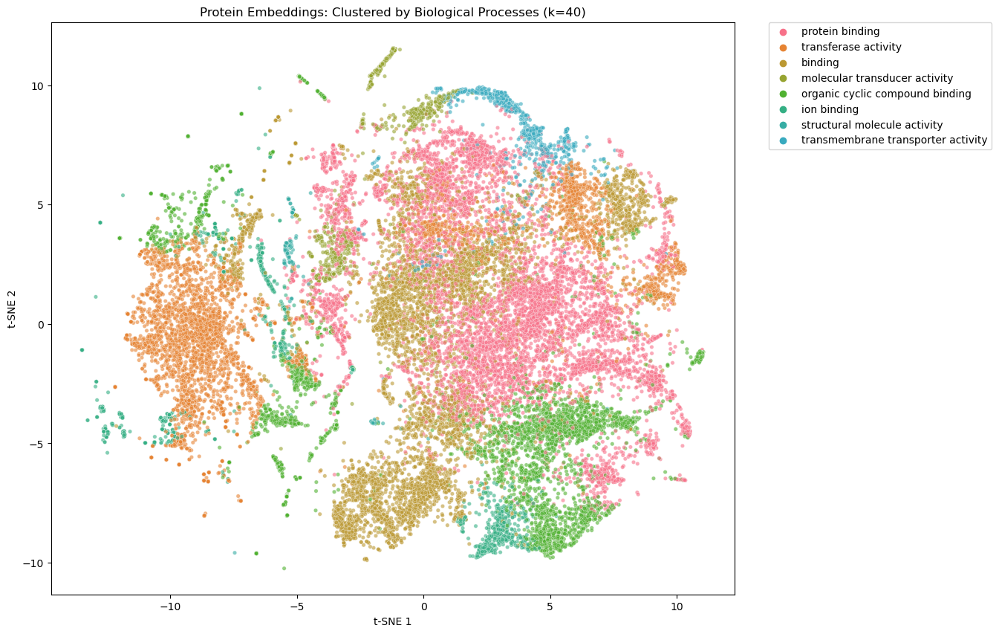

In [16]:
visualize_pipeline(embed_path=mf_embed_path, node_type = 'molecular_function', TxData_inst=TxData_inst, kmeans=True)

/om/user/tysinger/TxGNN/txgnn/data_splits/go-basic.obo: fmt(1.2) rel(2023-10-09) 46,296 Terms
Counter({'GO:0009987': 9903, 'GO:0065007': 9701, 'Other': 1906, 'GO:0032502': 1659, 'GO:0008152': 1528, 'GO:0032501': 1184, 'GO:0050896': 1009, 'GO:0022414': 789, 'GO:0051179': 569, 'GO:0002376': 207, 'GO:0044848': 63, 'GO:0040007': 55, 'GO:0040011': 39, 'GO:0098754': 10, 'GO:0048511': 7, 'GO:0000003': 7, 'GO:0043473': 6})
Counter({'Other': 17527, 'GO:0050789': 10312, 'GO:0065008': 417, 'GO:0065009': 363, 'GO:0006885': 21, 'GO:0060378': 2})
Counter({'Other': 22745, 'GO:0071704': 1725, 'GO:0009058': 1690, 'GO:0009056': 1299, 'GO:0044281': 816, 'GO:0044237': 129, 'GO:0032259': 102, 'GO:0019748': 64, 'GO:0042445': 27, 'GO:0042440': 26, 'GO:0006807': 8, 'GO:0045730': 4, 'GO:0070085': 3, 'GO:1990845': 2, 'GO:0044238': 1, 'GO:0070988': 1})
Counter({'GO:0050789': 9202, 'GO:0044237': 4068, 'Other': 2115, 'GO:0071840': 1022, 'GO:0071704': 821, 'GO:0048869': 820, 'GO:0048856': 722, 'GO:0007165': 624, 'G

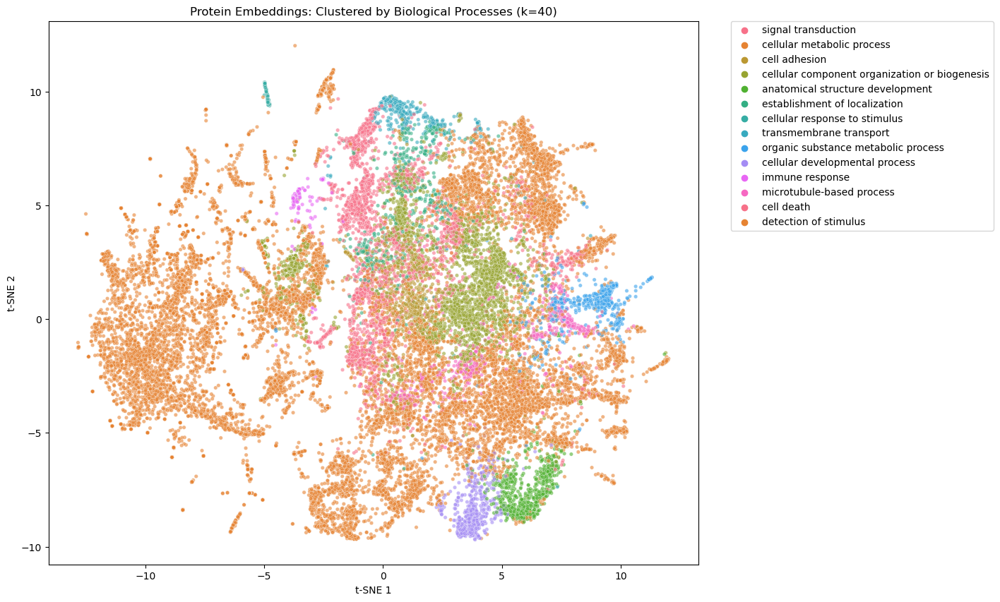

In [17]:
visualize_pipeline(embed_path=bp_embed_path, node_type = 'biological_process', TxData_inst=TxData_inst, kmeans=True)

/om/user/tysinger/TxGNN/txgnn/data_splits/go-basic.obo: fmt(1.2) rel(2023-10-09) 46,296 Terms
Counter({'GO:0003824': 7381, 'GO:0005488': 1816, 'GO:0005215': 989, 'GO:0003674': 428, 'Other': 273, 'GO:0098772': 183, 'GO:0005198': 42, 'GO:0140110': 22, 'GO:0038024': 17, 'GO:0140104': 15, 'GO:0045182': 3})
Counter({'Other': 9396, 'GO:0005515': 916, 'GO:0097159': 318, 'GO:0036094': 122, 'GO:0044877': 100, 'GO:0097367': 90, 'GO:0043167': 70, 'GO:0030246': 46, 'GO:0008289': 32, 'GO:0033218': 28, 'GO:0042562': 18, 'GO:0072341': 8, 'GO:0051540': 5, 'GO:0003823': 4, 'GO:1901681': 2, 'GO:0048038': 2, 'GO:0051192': 2, 'GO:0043176': 2, 'GO:0019215': 1, 'GO:0070026': 1, 'GO:0046812': 1, 'GO:0050840': 1, 'GO:0031409': 1, 'GO:0005549': 1, 'GO:0070025': 1, 'GO:0097243': 1})
Counter({'Other': 3800, 'GO:0016491': 2317, 'GO:0016740': 2281, 'GO:0016787': 1405, 'GO:0016829': 601, 'GO:0016853': 255, 'GO:0016874': 217, 'GO:0140640': 209, 'GO:0140096': 28, 'GO:0009975': 26, 'GO:0032451': 22, 'GO:0061783': 8})


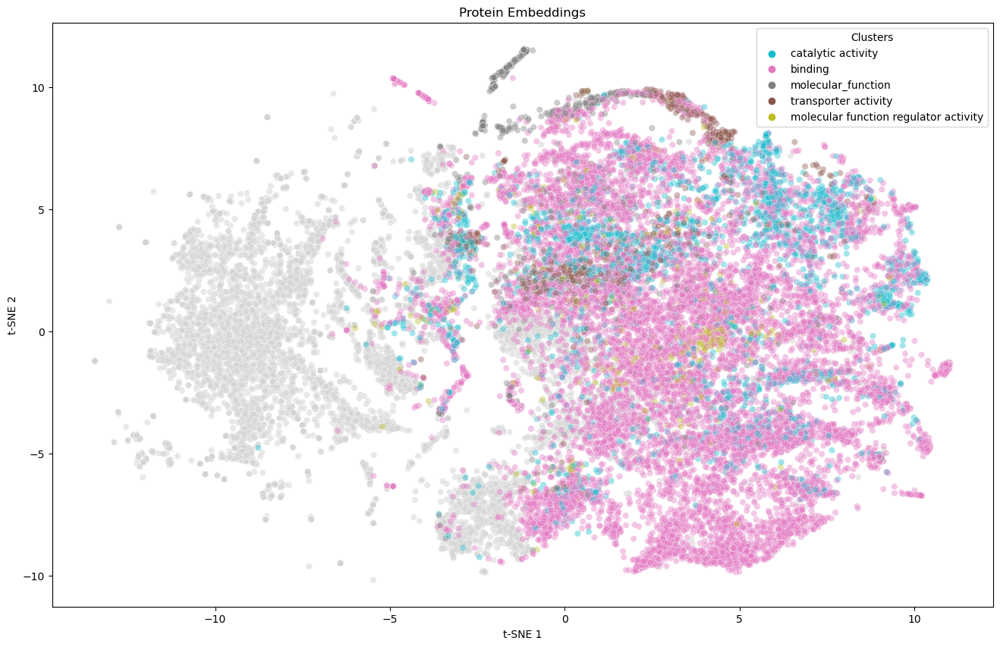

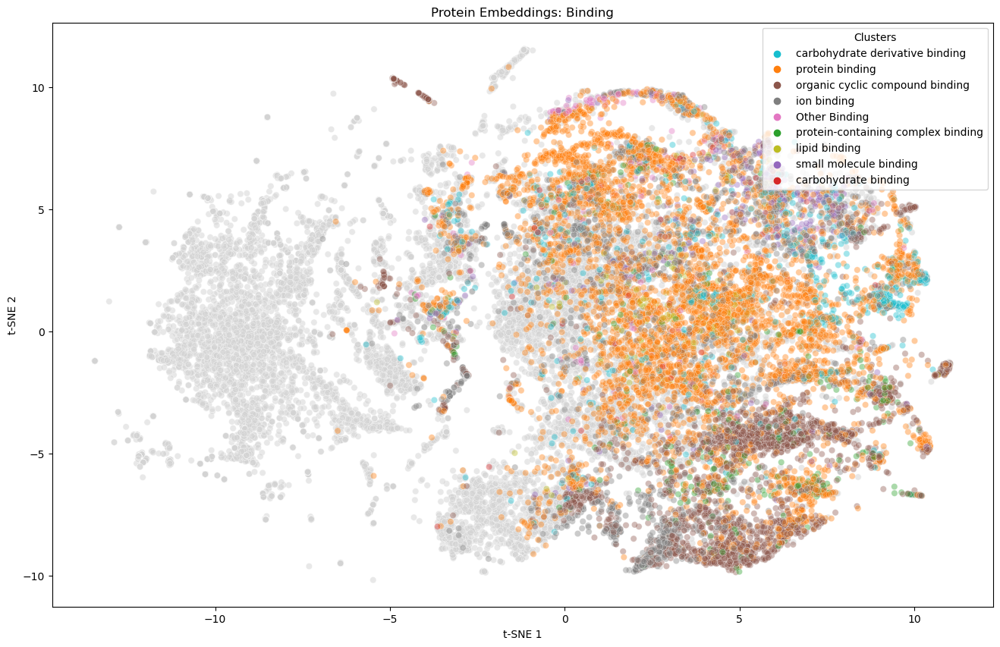

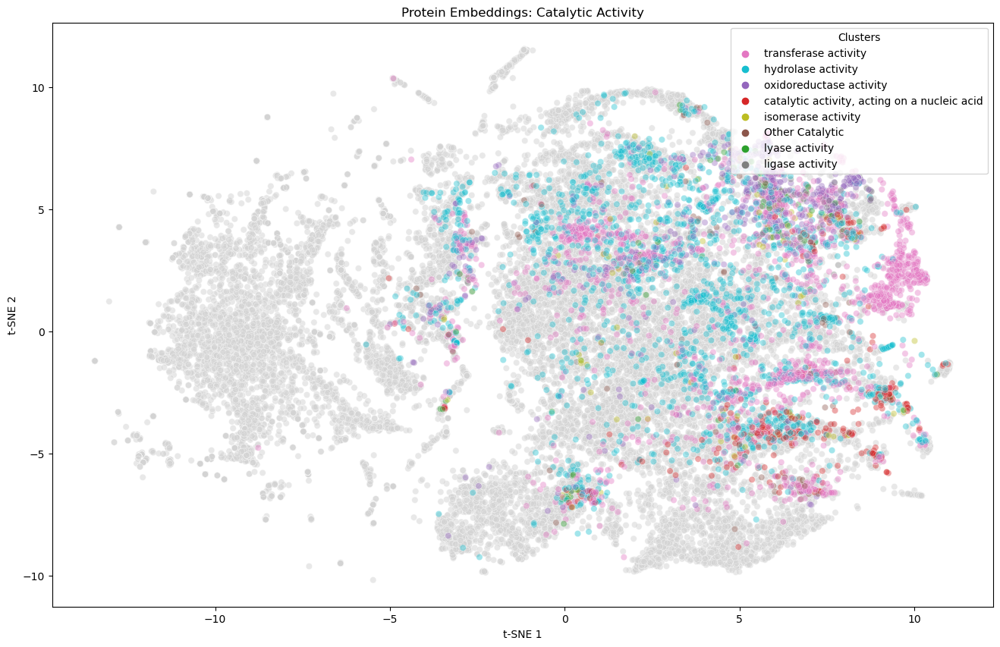

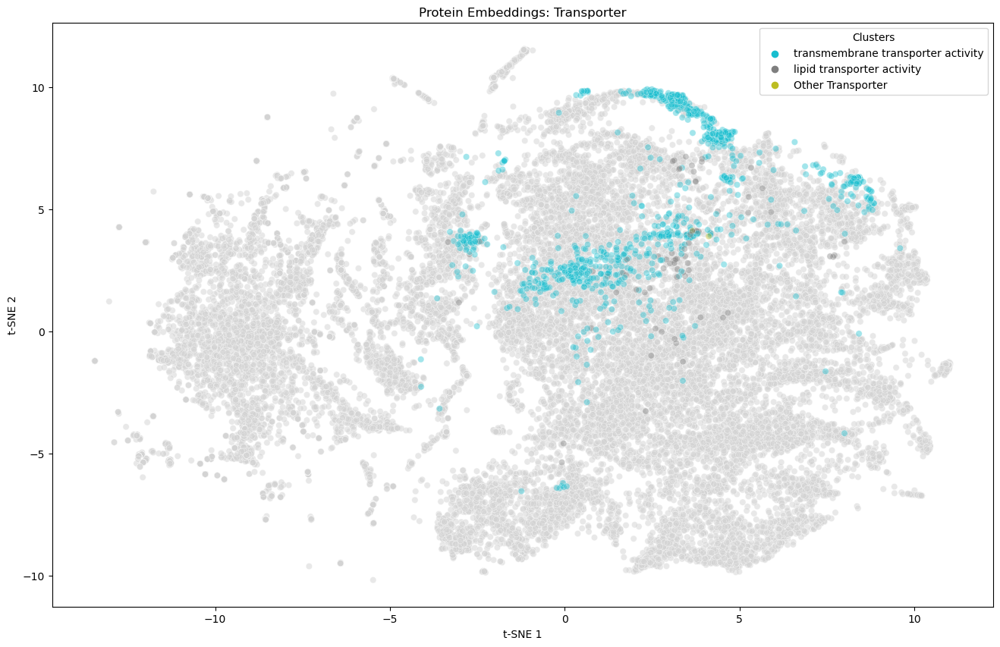

In [12]:
visualize_pipeline(embed_path=mf_embed_path, node_type = 'molecular_function', TxData_inst=TxData_inst)

/om/user/tysinger/TxGNN/txgnn/data_splits/go-basic.obo: fmt(1.2) rel(2023-10-09) 46,296 Terms
Found local copy...
Found local copy...
Found local copy...
Found saved processed KG... Loading...
Splits detected... Loading splits....
Creating DGL graph....
Done!
Counter({'GO:0003824': 7381, 'GO:0005488': 1816, 'GO:0005215': 989, 'GO:0003674': 428, 'Other': 273, 'GO:0098772': 183, 'GO:0005198': 42, 'GO:0140110': 22, 'GO:0038024': 17, 'GO:0140104': 15, 'GO:0045182': 3})
Counter({'Other': 9396, 'GO:0005515': 916, 'GO:0097159': 318, 'GO:0036094': 181, 'GO:0044877': 100, 'GO:0043167': 77, 'GO:0030246': 46, 'GO:0008289': 35, 'GO:0033218': 29, 'GO:0097367': 24, 'GO:0042562': 18, 'GO:0072341': 8, 'GO:0051540': 5, 'GO:1901681': 2, 'GO:0048038': 2, 'GO:0051192': 2, 'GO:0043176': 2, 'GO:0019215': 1, 'GO:0070026': 1, 'GO:0046812': 1, 'GO:0050840': 1, 'GO:0031409': 1, 'GO:0005549': 1, 'GO:0070025': 1, 'GO:0097243': 1})
Counter({'Other': 3800, 'GO:0016740': 2416, 'GO:0016491': 2286, 'GO:0016787': 1127,

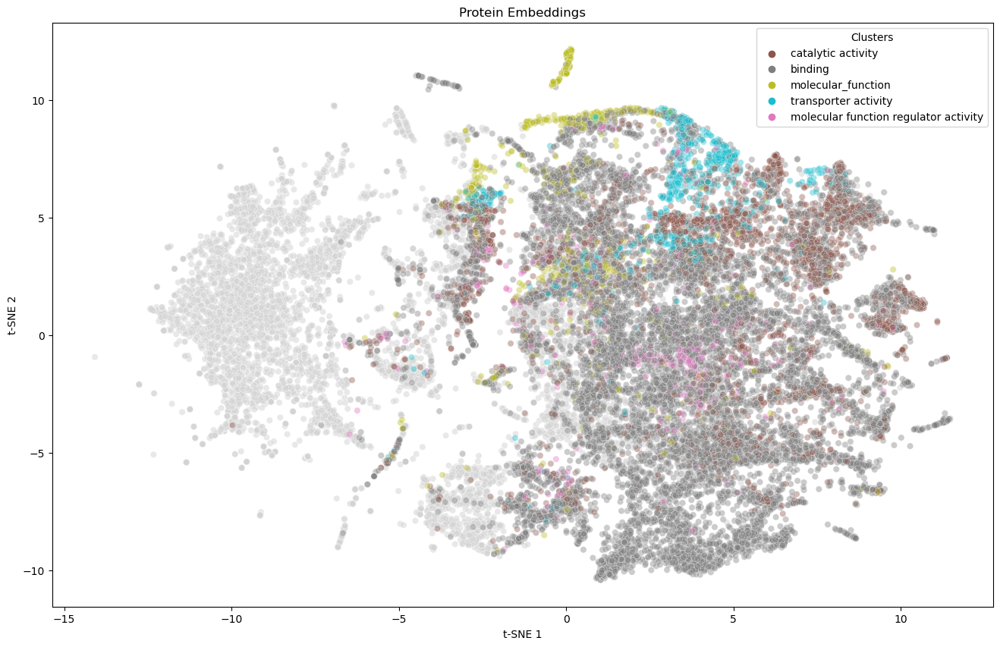

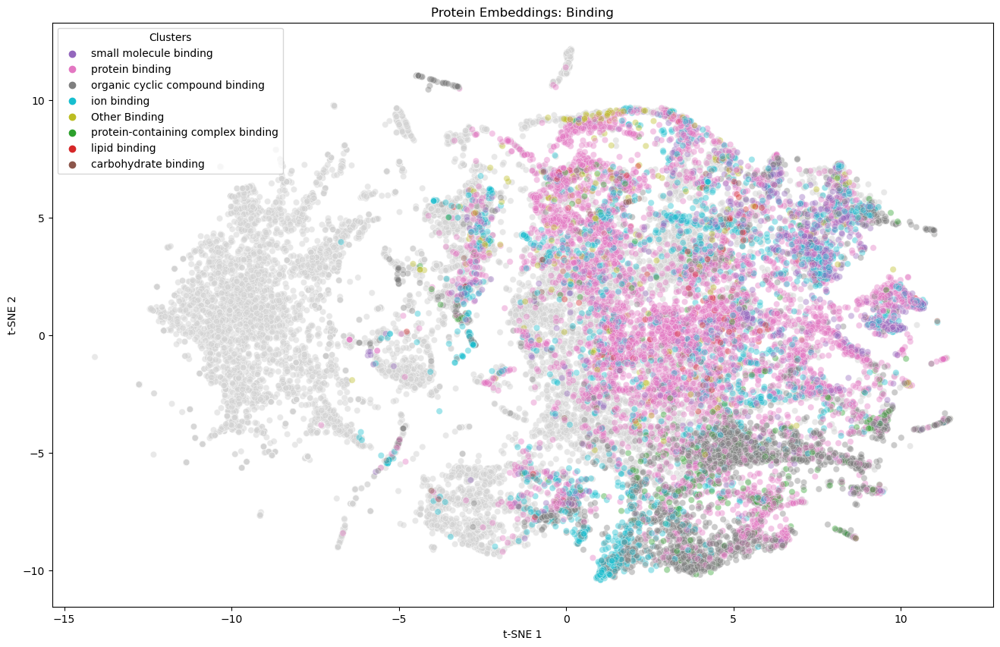

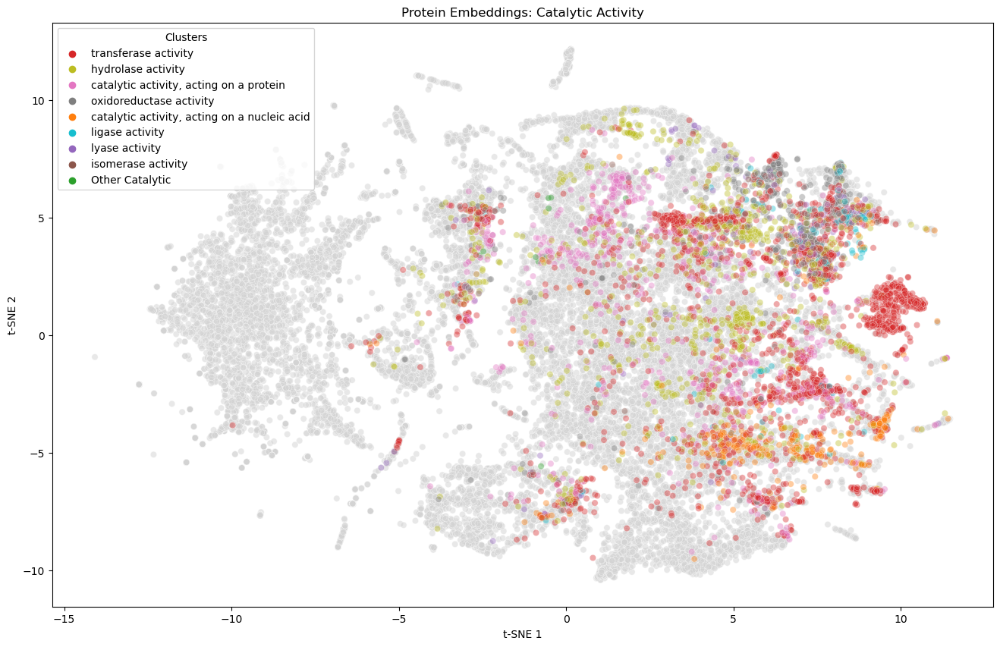

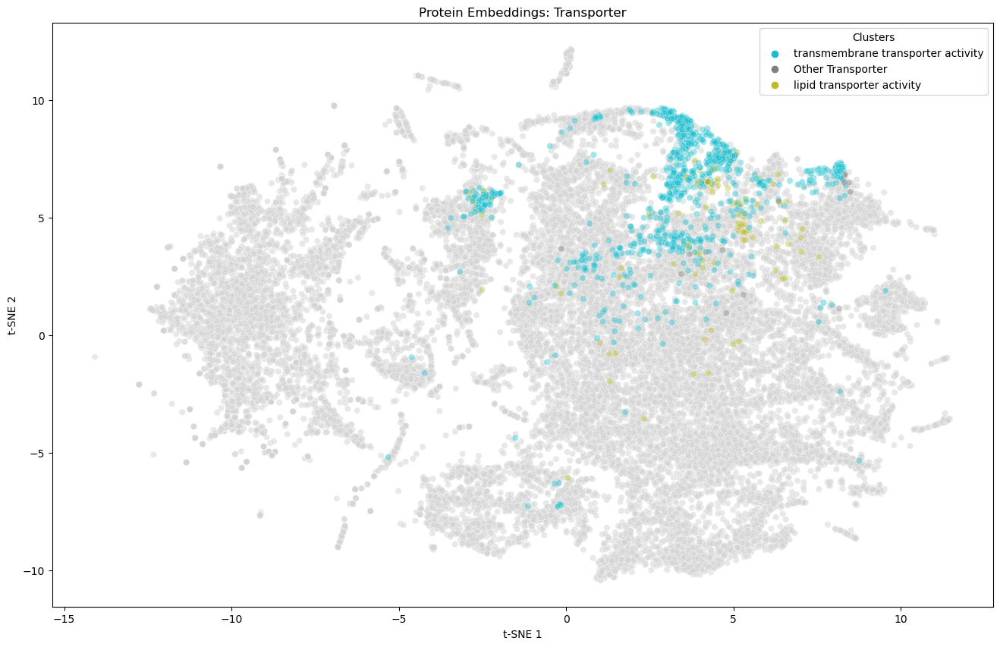

In [96]:
visualize_pipeline(embed_path=mf_bp_embed_path, node_type = 'molecular_function')

/om/user/tysinger/TxGNN/txgnn/data_splits/go-basic.obo: fmt(1.2) rel(2023-10-09) 46,296 Terms
Counter({'GO:0009987': 9903, 'GO:0065007': 9701, 'Other': 1906, 'GO:0032502': 1659, 'GO:0008152': 1528, 'GO:0032501': 1184, 'GO:0050896': 1009, 'GO:0022414': 789, 'GO:0051179': 569, 'GO:0002376': 207, 'GO:0044848': 63, 'GO:0040007': 55, 'GO:0040011': 39, 'GO:0098754': 10, 'GO:0048511': 7, 'GO:0000003': 7, 'GO:0043473': 6})
Counter({'Other': 17527, 'GO:0050789': 10312, 'GO:0065008': 417, 'GO:0065009': 363, 'GO:0006885': 21, 'GO:0060378': 2})
Counter({'Other': 22745, 'GO:0071704': 5507, 'GO:0044237': 201, 'GO:0032259': 103, 'GO:0006807': 23, 'GO:0009058': 12, 'GO:0042440': 11, 'GO:0009056': 6, 'GO:0044281': 5, 'GO:0019748': 4, 'GO:0045730': 4, 'GO:0016999': 3, 'GO:0070085': 3, 'GO:1990845': 2, 'GO:1901275': 2, 'GO:1901764': 2, 'GO:0018933': 2, 'GO:0032963': 2, 'GO:0051189': 2, 'GO:0042445': 1, 'GO:0044238': 1, 'GO:0070988': 1})
Counter({'GO:0050789': 9202, 'GO:0044237': 4128, 'Other': 2115, 'GO:

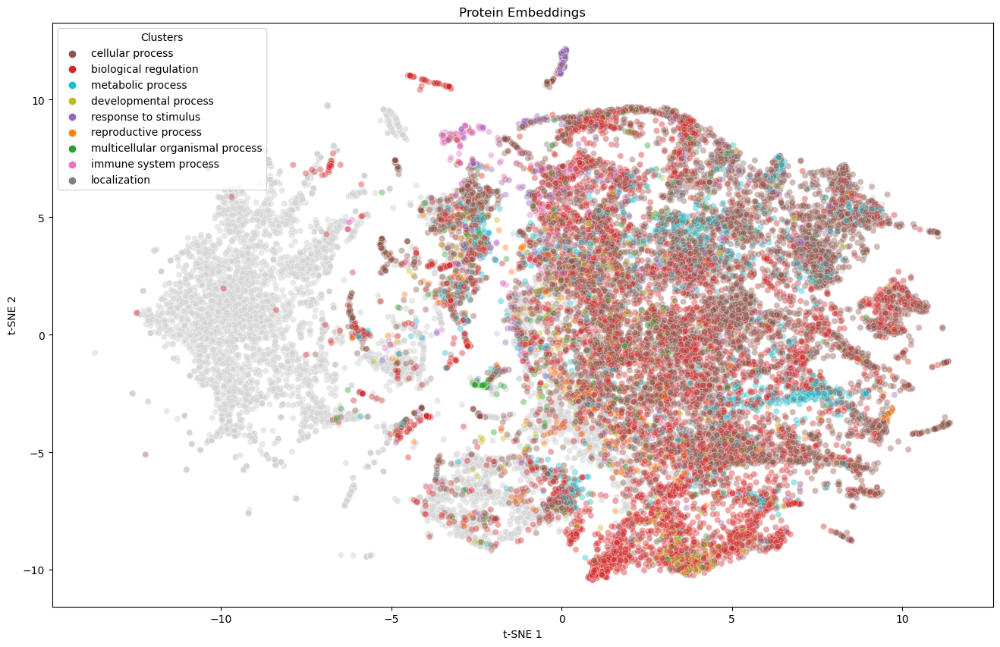

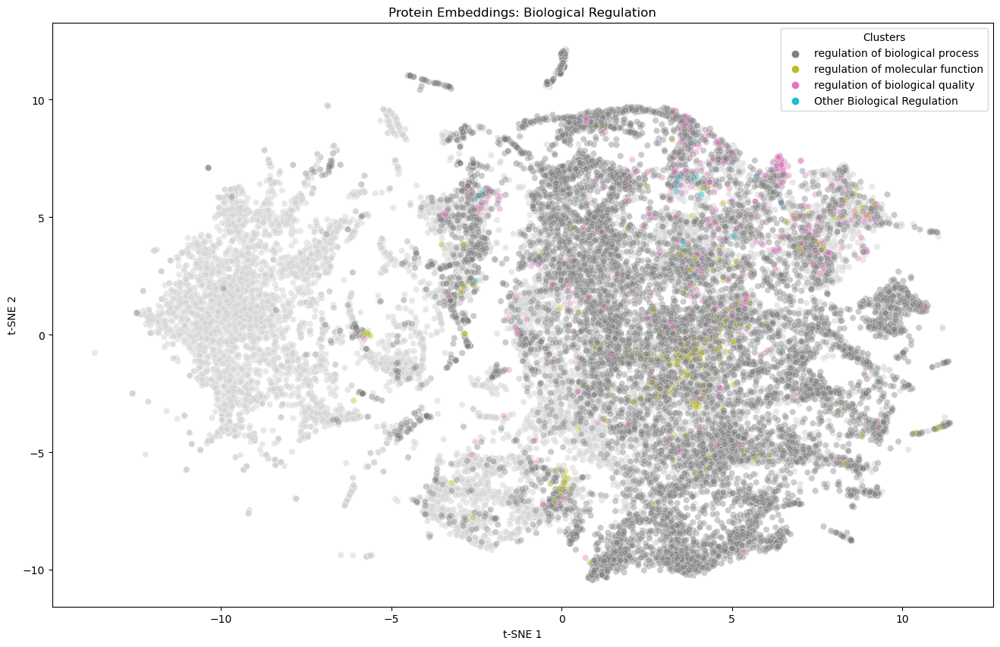

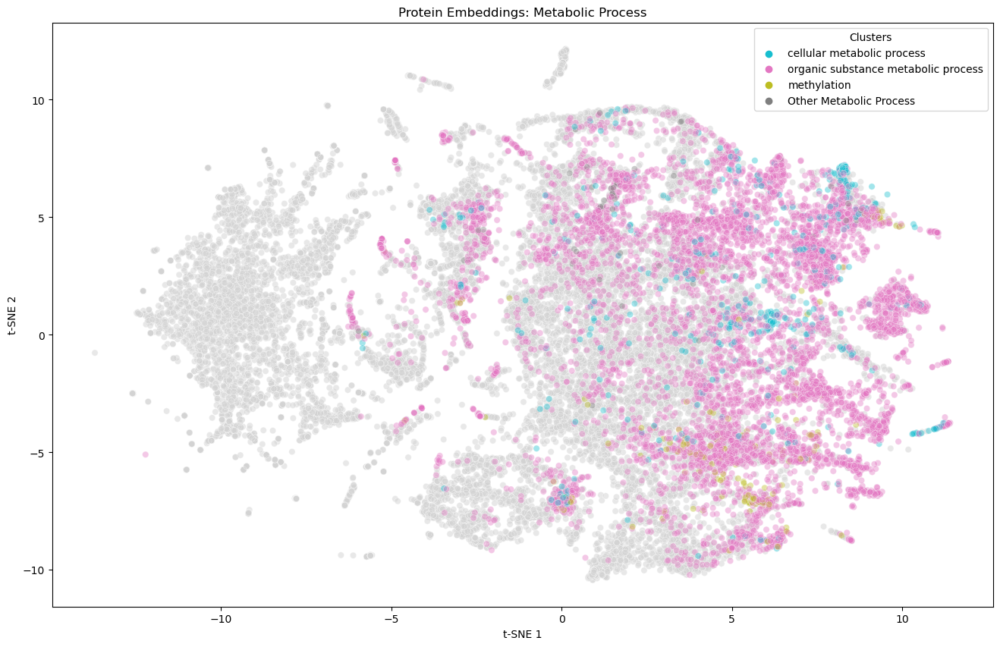

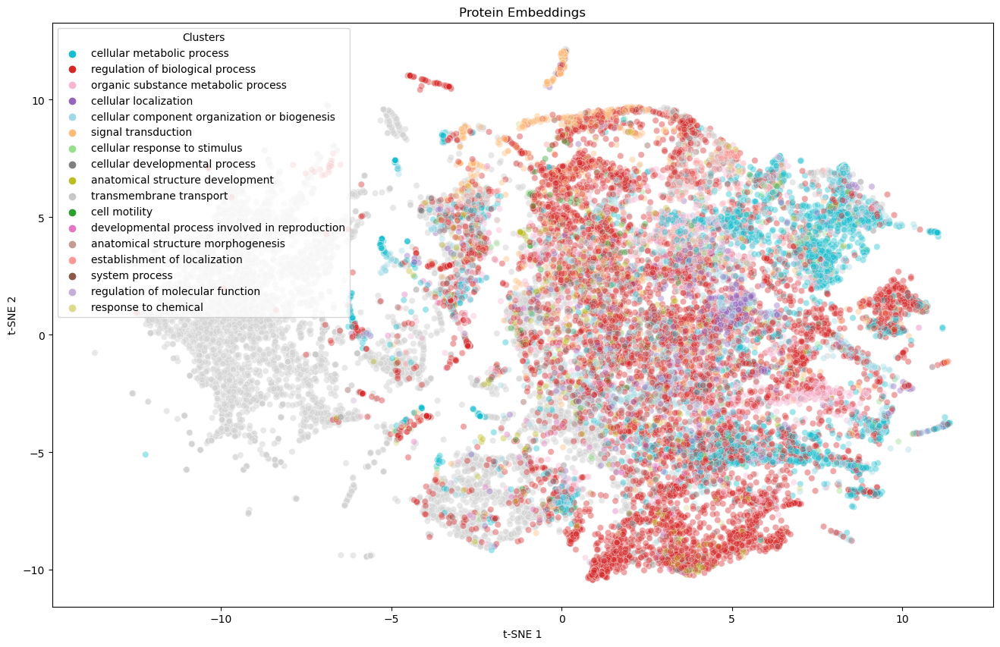

In [10]:
visualize_pipeline(embed_path=mf_bp_embed_path, node_type = 'biological_process', TxData_inst=TxData_inst)

In [82]:
second_level_cluster_functions, second_level_cluster_functions_names = get_cluster_labels(second_level_parent_go_bp, second_level_bp_goid2name, clusters_40, filter='GO:0050789')
second_level_go_assignments40 = [second_level_cluster_functions_names[cluster] for cluster in cluster_assignments40]

Looped through proteins of cluster 9
Looped through proteins of cluster 3
Looped through proteins of cluster 7
Looped through proteins of cluster 36
Looped through proteins of cluster 16
Looped through proteins of cluster 35
Looped through proteins of cluster 5
Looped through proteins of cluster 13
Looped through proteins of cluster 24
Looped through proteins of cluster 18
Looped through proteins of cluster 8
Looped through proteins of cluster 25
Looped through proteins of cluster 4
Looped through proteins of cluster 22
Looped through proteins of cluster 30
Looped through proteins of cluster 15
Looped through proteins of cluster 10
Looped through proteins of cluster 17
Looped through proteins of cluster 14
Looped through proteins of cluster 1
Looped through proteins of cluster 6
Looped through proteins of cluster 28
Looped through proteins of cluster 12
Looped through proteins of cluster 32
Looped through proteins of cluster 39
Looped through proteins of cluster 33
Looped through prote

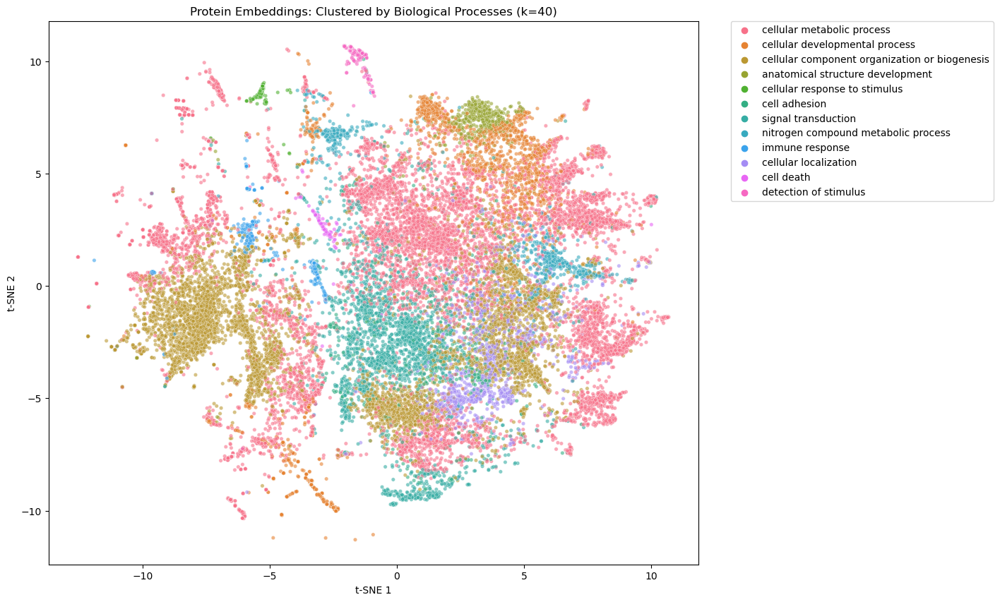

In [99]:
plot_kmeans(second_level_go_assignments40, prot_tsne_results)

In [73]:
second_level_bp_goid2name_reverse = {value:key for key, value in second_level_bp_goid2name.items()}
second_level_bp_goid2name_reverse['regulation of biological process']

'GO:0050789'

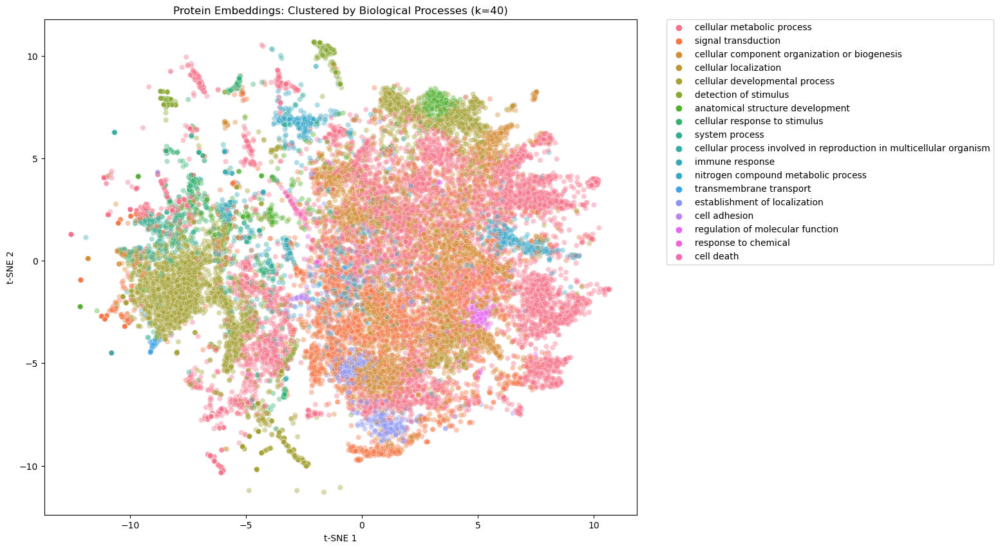

In [81]:
#second_level_cluster_functions, second_level_cluster_functions_names = get_cluster_labels(second_level_parent_go_bp, second_level_bp_goid2name, clusters_100, filter='GO:0050789')
#second_level_go_assignments100 = [second_level_cluster_functions_names[cluster] for cluster in cluster_assignments100]
plot_kmeans(second_level_go_assignments100, prot_tsne_results)